# Inference Tutorial
## Dependencies, Global Variables & Model Initialization

In [1]:
from PIL import Image

import sys
sys.path.append('..')
from mmseg.apis import init_segmentor, inference_segmentor, show_result_pyplot
from mmseg.core.evaluation import get_palette

No CUDA runtime is found, using CUDA_HOME='/usr'


These variables should be changed with your paths to the model, config file, and image.

In [2]:
CONFIG_FILE           = '../3_class_model/config.py'
CHECKPOINT_FILE       = '../3_class_model/iter_40000.pth'
IMAGE_PATH            = '../data/demo/00000269.tif'
TYPE_OF_INTEREST      = 'Paragraph'
WORD_LENGTH_THRESHOLD = 30
INTERVAL_THRESHOLD    = 500

You should download the model together with its config file from the specified location belowe if you want to run the notebook with a model trained on Prima Dataset with custom 3-class taxonomy.
* https://drive.google.com/drive/folders/1zOXvcoHRwZZWZIC5mTYRVoxAI2rQUepe?usp=sharing - download SETR-PUP(Progressive Upsampling) and its configuration file and put them in the folder '3_class_model'
* https://drive.google.com/drive/folders/1ShZB0FlnGa2xXpFdWQCAptPARonXMv2g?usp=sharing - download SETR-MLA(Multi-Level Feature Aggregation)and its configuration file and put them in the folder '3_class_model'

In [3]:
model = init_segmentor(CONFIG_FILE, CHECKPOINT_FILE)

load pre-trained weight from imagenet21k


In [4]:
LABEL_MAP = {i:model.CLASSES[i] for i in range(len(model.CLASSES))}

In [ ]:
result = inference_segmentor(model, IMAGE_PATH)

In [ ]:
show_result_pyplot(model, IMAGE_PATH, result, model.PALETTE)

In [7]:
im = Image.open(IMAGE_PATH)

## From Mask to Bounding Box

In [8]:
import src.post_processing.get_blocks as gb

In [ ]:
result = result[0]

In [9]:
layout = gb.bbox_yield(result, LABEL_MAP)

layout, other_boxes = gb.class_of_interest(layout, TYPE_OF_INTEREST)

layout = gb.remove_empty_rectangles(im, layout, WORD_LENGTH_THRESHOLD)

## Ordering 

In [10]:
import src.post_processing.post_segmentation as ps

In [11]:
post_process = ps.PostProcessingSegmentation(layout, im)

In [12]:
post_layout = post_process.pipeline(INTERVAL_THRESHOLD)

In [13]:
post_image = gb.mask_other_regions(im, other_boxes)

## Visulization

In [14]:
import src.visualization as viz

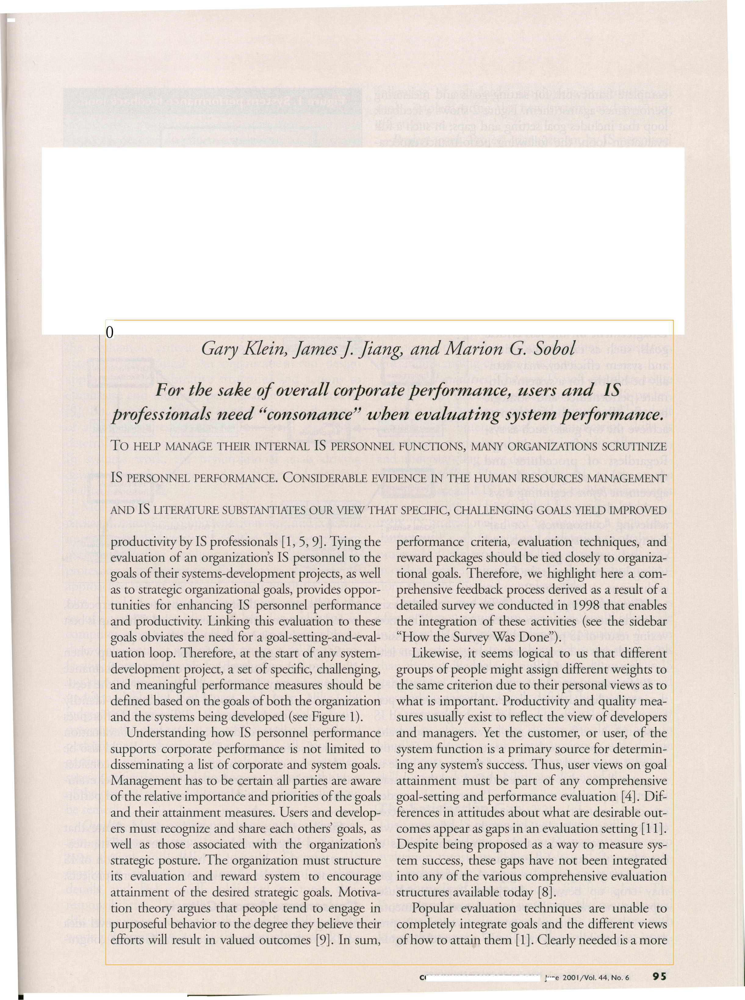

In [15]:
viz.draw_box(post_image, post_layout,
            box_width=3, 
            show_element_id=True,
            id_font_size=50)

## OCR

In [16]:
gb.ocr(post_image, post_layout)

Gary Klein, James J. Jiang, and Marion G. Sobol

For the sake of overall corporate performance, users and IS

professionals need “consonance” when evaluating system performance.

‘TO HELP MANAGE THEIR INTERNAL IS PERSONNEL FUNCTIONS, MANY ORGANIZATIONS SCRUTINIZE

IS PERSONNEL PERFORMANCE. CONSIDERABLE EVIDENCE IN THE HUMAN RESOURCES MANAGEMENT

AND IS LITERATURE SUBSTANTIATES OUR VIEW THAT SPECIFIC, CHALLENGING GOALS YIELD IMPROVED

productivity by IS professionals [1, 5, 9]. Tying the
evaluation of an organization's IS personnel to the
goals of their systems-development projects, as well
as to strategic organizational goals, provides oppor-
tunities for enhancing IS personnel performance
and productivity. Linking this evaluation to these
goals obviates the need for a goal-setting-and-eval-
uation loop. Therefore, at the start of any system-
development project, a set of specific, challenging,
and meaningful performance measures should be
defined based on the goals of both the organiz

Layout(_blocks=Layout(_blocks=[TextBlock(block=Rectangle(x_1=346, y_1=1048, x_2=2207, y_2=3159), text=Gary Klein, James J. Jiang, and Marion G. Sobol

For the sake of overall corporate performance, users and IS

professionals need “consonance” when evaluating system performance.

‘TO HELP MANAGE THEIR INTERNAL IS PERSONNEL FUNCTIONS, MANY ORGANIZATIONS SCRUTINIZE

IS PERSONNEL PERFORMANCE. CONSIDERABLE EVIDENCE IN THE HUMAN RESOURCES MANAGEMENT

AND IS LITERATURE SUBSTANTIATES OUR VIEW THAT SPECIFIC, CHALLENGING GOALS YIELD IMPROVED

productivity by IS professionals [1, 5, 9]. Tying the
evaluation of an organization's IS personnel to the
goals of their systems-development projects, as well
as to strategic organizational goals, provides oppor-
tunities for enhancing IS personnel performance
and productivity. Linking this evaluation to these
goals obviates the need for a goal-setting-and-eval-
uation loop. Therefore, at the start of any system-
development project, a set of specific, cha